In [1]:
from src.HestonModel import generate_heston_paths
from src.Two_parameters_functions import signatures_calculations_with_2parameters
import numpy as np
import esig
import matplotlib.pyplot as plt
import signatory
import torch
from tqdm.auto import tqdm
from mpl_toolkits.mplot3d import Axes3D

In [2]:
# constant Heston parameters
thetas=0.15 #Long run variance θ
kappas= 2 # Mean reversion κ
v_0s = thetas #  Initial variance
rhos = 0.6 #Correlation ρ, correlation between the log-returns and volatility of the asset
sigmas = 0.6 #Volatility of variance σ
rs = 0.04 #Interest rate

S = 100
paths = 10000
steps = 50
T = 1

In [3]:
depth_of_sig=2  #level of truncation of signatures
width_of_sig=3  # prices + sigmas + time_array (parameters for signatures)
sig_keys = esig.sigkeys(width_of_sig, depth_of_sig)
sig_dim=signatory.signature_channels(width_of_sig,depth_of_sig)

In [4]:
by_parameter_2= {
    "by_rs": np.linspace(0.01,0.15,50),  # list to store 50 elements for var2
    "by_rhos": np.linspace(0.0,1.0,50),  # list to store 50 elements for var3
    "by_sigmas": np.linspace(0.0,1.1,50),  # list to store 50 elements for var4
    "by_kappas": np.linspace(.5,5.0,50),   # list to store 50 elements for var5
    "by_thetas": np.linspace(0.01,0.8,50)  # list to store 50 elements for var1
}

In [5]:
results_thetas_and_kappas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='theta',par2='kappa')
# results_kappas_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='theta')
# results_thetas_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='theta',par2='sigma')
# results_sigmas_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='theta')
# results_thetas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='theta',par2='rho')
# results_rhos_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='theta')
# results_kappas_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='sigma')
# results_sigmas_and_kappas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='kappa')
# results_sigmas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='rho')
# results_rhos_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='sigma')
# results_kappas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='rho')
# results_rhos_and_kappas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='kappa')


Thetas and Kappas

In [7]:
signatures_results_thetas_and_kappas_2_parameters=results_thetas_and_kappas_2_parameters[0]
Exp_signatures_results_thetas_and_kappas_2_parameters=results_thetas_and_kappas_2_parameters[1]

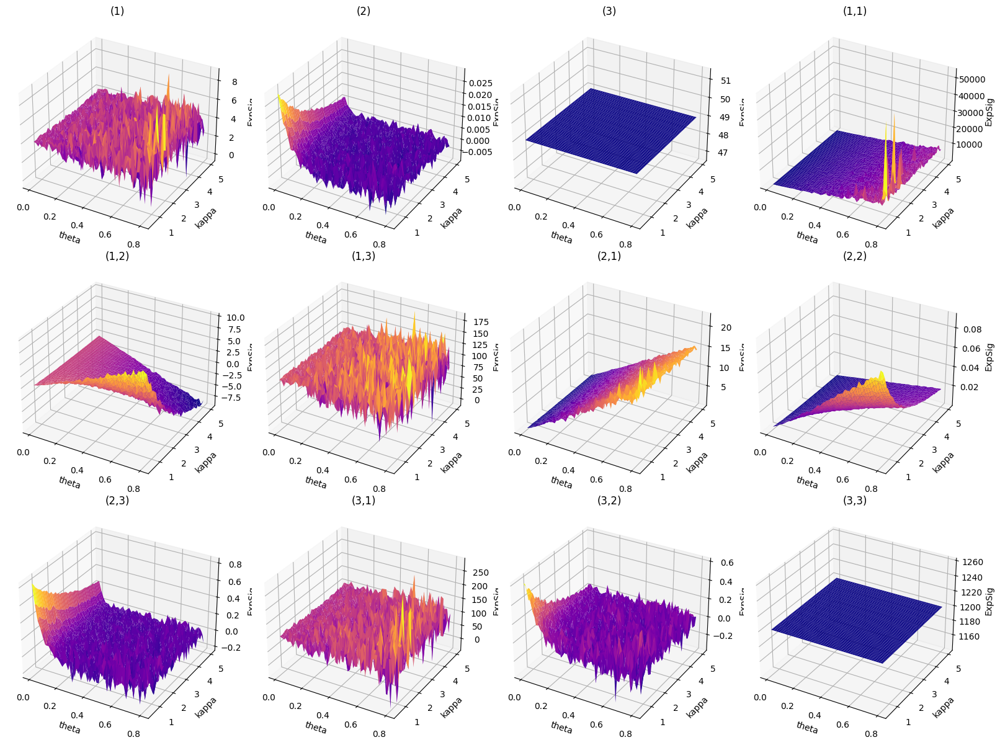

In [8]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    theta_axs, kappa_axs=np.meshgrid(by_parameter_2["by_thetas"],by_parameter_2["by_kappas"])
    ax.plot_surface(theta_axs,kappa_axs,Exp_signatures_results_thetas_and_kappas_2_parameters.T[i],cmap='plasma', linewidths=0.1, shade=True)
    axs[i].set_xlabel('theta')
    axs[i].set_ylabel('kappa')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Kappas and Thetas

In [9]:
results_kappas_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='theta')

In [10]:
signatures_results_kappas_and_thetas_2_parameters=results_kappas_and_thetas_2_parameters[0]
Exp_signatures_results_kappas_and_thetas_2_parameters=results_kappas_and_thetas_2_parameters[1]

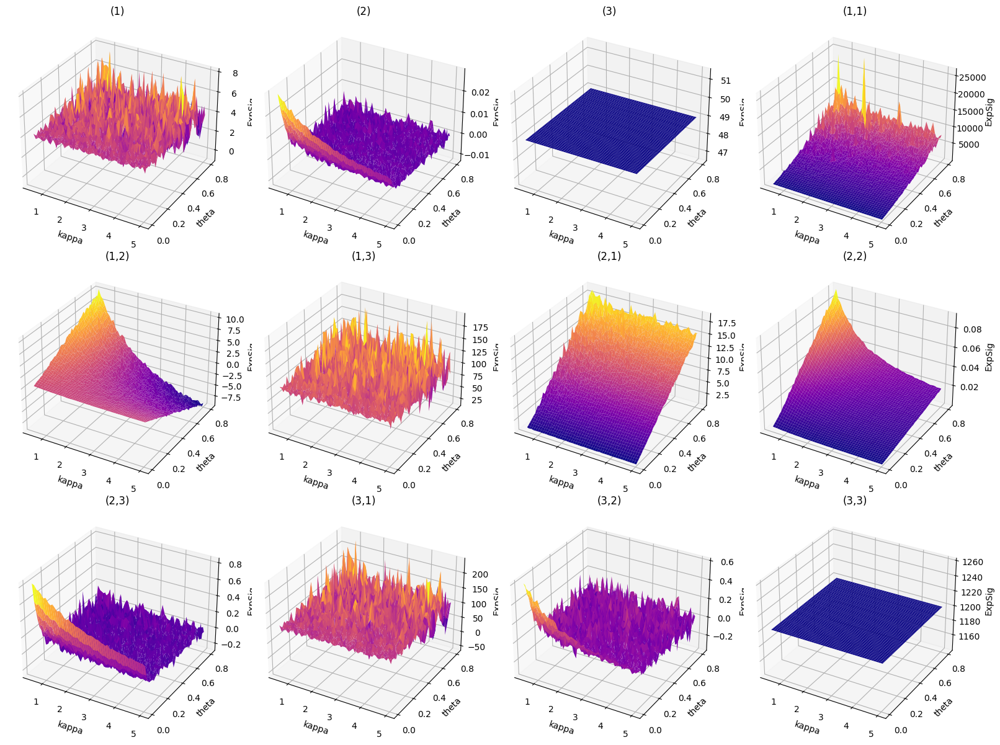

In [11]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    kappa_axs, theta_axs=np.meshgrid(by_parameter_2["by_kappas"],by_parameter_2["by_thetas"])
    ax.plot_surface(kappa_axs,theta_axs,Exp_signatures_results_kappas_and_thetas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('kappa')
    axs[i].set_ylabel('theta')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Thetas and Sigmas:

In [12]:
results_thetas_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='theta',par2='sigma')

In [13]:
signatures_results_thetas_and_sigmas_2_parameters=results_thetas_and_sigmas_2_parameters[0]
Exp_signatures_results_thetas_and_sigmas_2_parameters=results_thetas_and_sigmas_2_parameters[1]

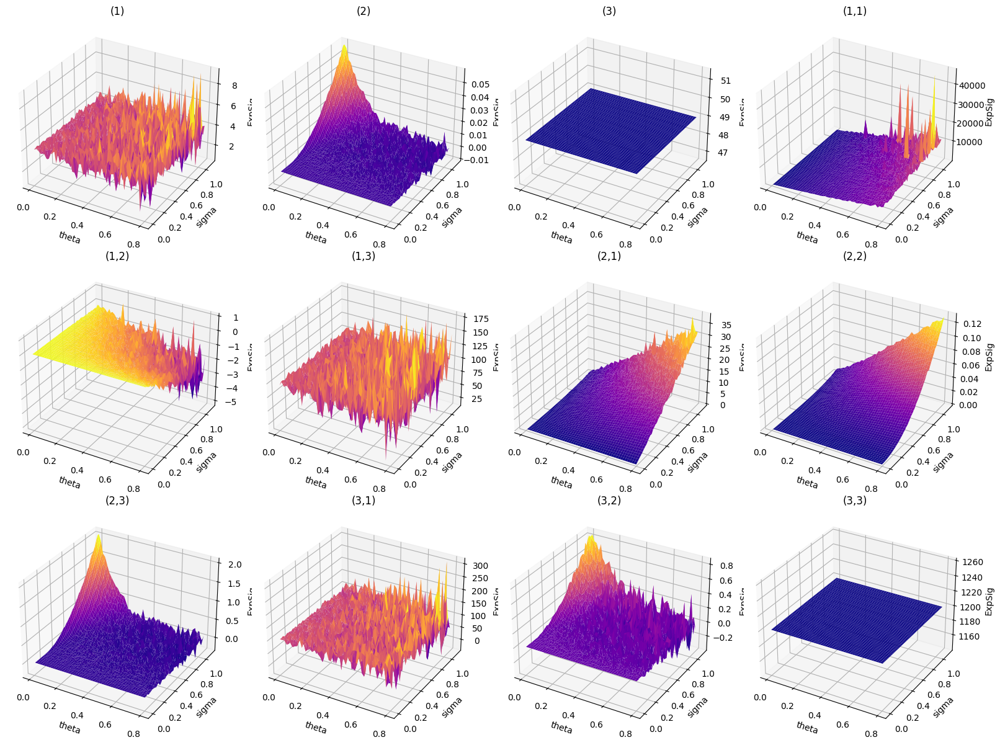

In [14]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    theta_axs, sigma_axs=np.meshgrid(by_parameter_2["by_thetas"],by_parameter_2["by_sigmas"])
    ax.plot_surface(theta_axs,sigma_axs,Exp_signatures_results_thetas_and_sigmas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('theta')
    axs[i].set_ylabel('sigma')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Sigmas and Thetas

In [15]:
results_sigmas_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='theta')

In [16]:
signatures_results_sigmas_and_thetas_2_parameters=results_sigmas_and_thetas_2_parameters[0]
Exp_signatures_results_sigmas_and_thetas_2_parameters=results_sigmas_and_thetas_2_parameters[1]

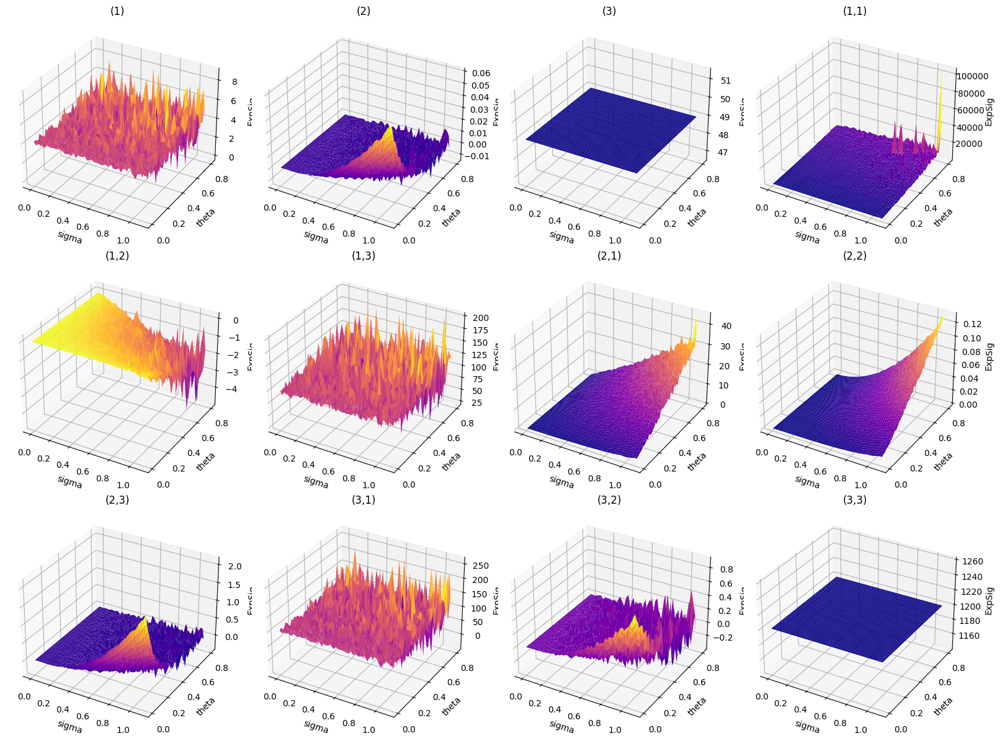

In [17]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    sigma_axs, theta_axs=np.meshgrid(by_parameter_2["by_sigmas"],by_parameter_2["by_thetas"])
    ax.plot_surface(sigma_axs,theta_axs,Exp_signatures_results_sigmas_and_thetas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('sigma')
    axs[i].set_ylabel('theta')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Thetas and Rhos

In [18]:
results_thetas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='theta',par2='rho')

In [19]:
signatures_results_thetas_and_rhos_2_parameters=results_thetas_and_rhos_2_parameters[0]
Exp_signatures_results_thetas_and_rhos_2_parameters=results_thetas_and_rhos_2_parameters[1]

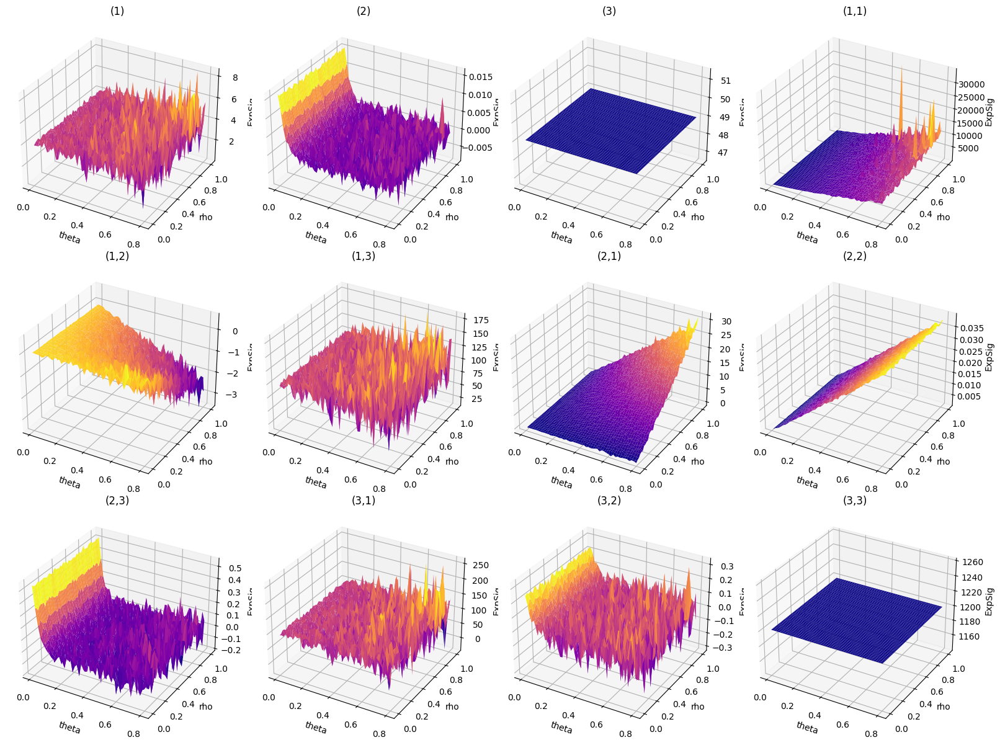

In [20]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    theta_axs, rho_axs=np.meshgrid(by_parameter_2["by_thetas"],by_parameter_2["by_rhos"])
    ax.plot_surface(theta_axs,rho_axs,Exp_signatures_results_thetas_and_rhos_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('theta')
    axs[i].set_ylabel('rho')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Rhos and Thetas

In [21]:
results_rhos_and_thetas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='theta')

In [22]:
signatures_results_rhos_and_thetas_2_parameters=results_rhos_and_thetas_2_parameters[0]
Exp_signatures_results_rhos_and_thetas_2_parameters=results_rhos_and_thetas_2_parameters[1]

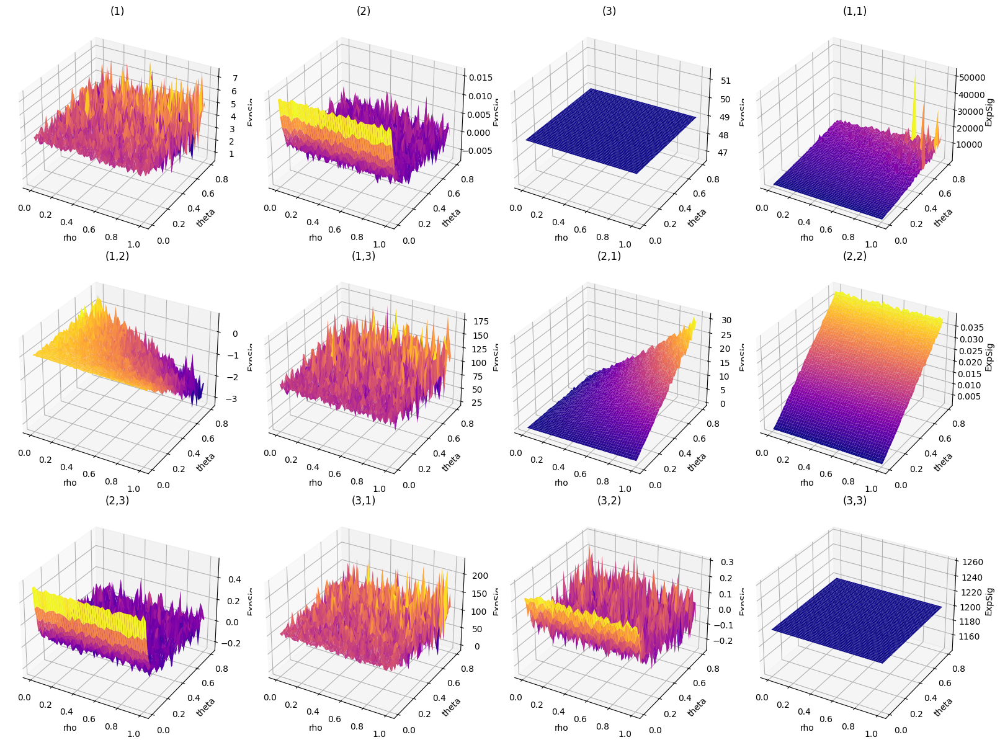

In [23]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    rho_axs, theta_axs=np.meshgrid(by_parameter_2["by_rhos"],by_parameter_2["by_thetas"])
    ax.plot_surface(rho_axs,theta_axs,Exp_signatures_results_rhos_and_thetas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('rho')
    axs[i].set_ylabel('theta')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Kappas and Sigmas

In [5]:
results_kappas_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='sigma')

In [6]:
signatures_results_kappas_and_sigmas_2_parameters=results_kappas_and_sigmas_2_parameters[0]
Exp_signatures_results_kappas_and_sigmas_2_parameters=results_kappas_and_sigmas_2_parameters[1]

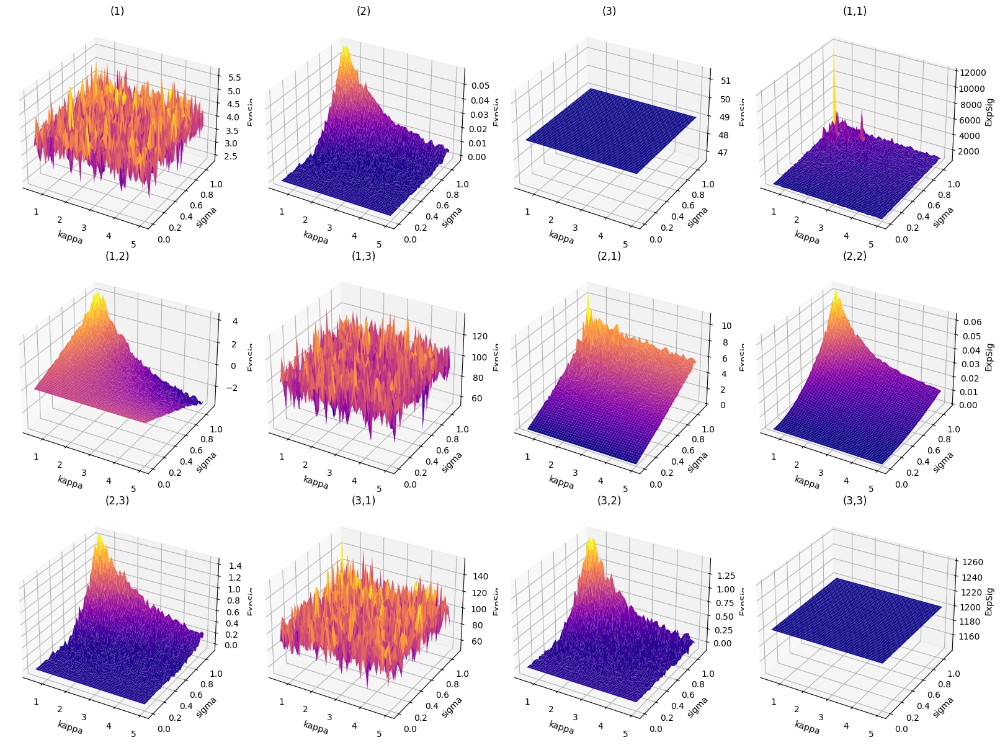

In [7]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    kappa_axs, sigma_axs=np.meshgrid(by_parameter_2["by_kappas"],by_parameter_2["by_sigmas"])
    ax.plot_surface(kappa_axs,sigma_axs,Exp_signatures_results_kappas_and_sigmas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('kappa')
    axs[i].set_ylabel('sigma')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Sigmas and Kappas

In [8]:
results_sigmas_and_kappas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='kappa')

In [9]:
signatures_results_sigmas_and_kappas_2_parameters=results_sigmas_and_kappas_2_parameters[0]
Exp_signatures_results_sigmas_and_kappas_2_parameters=results_sigmas_and_kappas_2_parameters[1]

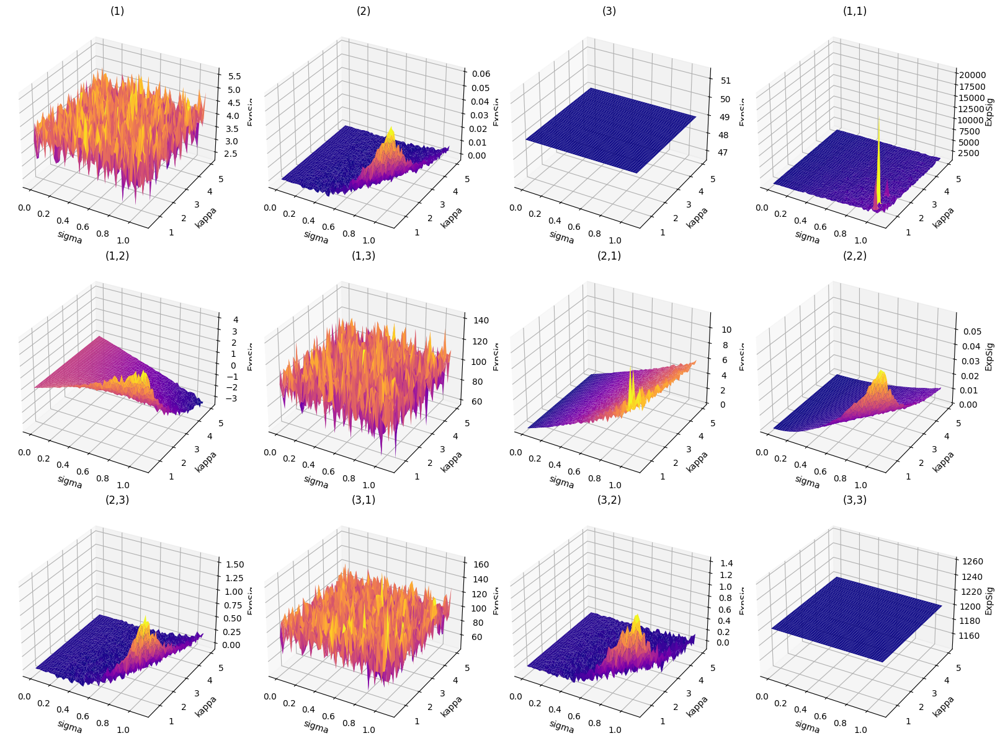

In [10]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    sigma_axs, kappa_axs=np.meshgrid(by_parameter_2["by_sigmas"],by_parameter_2["by_kappas"])
    ax.plot_surface(sigma_axs,kappa_axs,Exp_signatures_results_sigmas_and_kappas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('sigma')
    axs[i].set_ylabel('kappa')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Sigmas and Rhos

In [11]:
results_sigmas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='sigma',par2='rho')

In [12]:
signatures_results_sigmas_and_rhos_2_parameters=results_sigmas_and_rhos_2_parameters[0]
Exp_signatures_results_sigmas_and_rhos_2_parameters=results_sigmas_and_rhos_2_parameters[1]

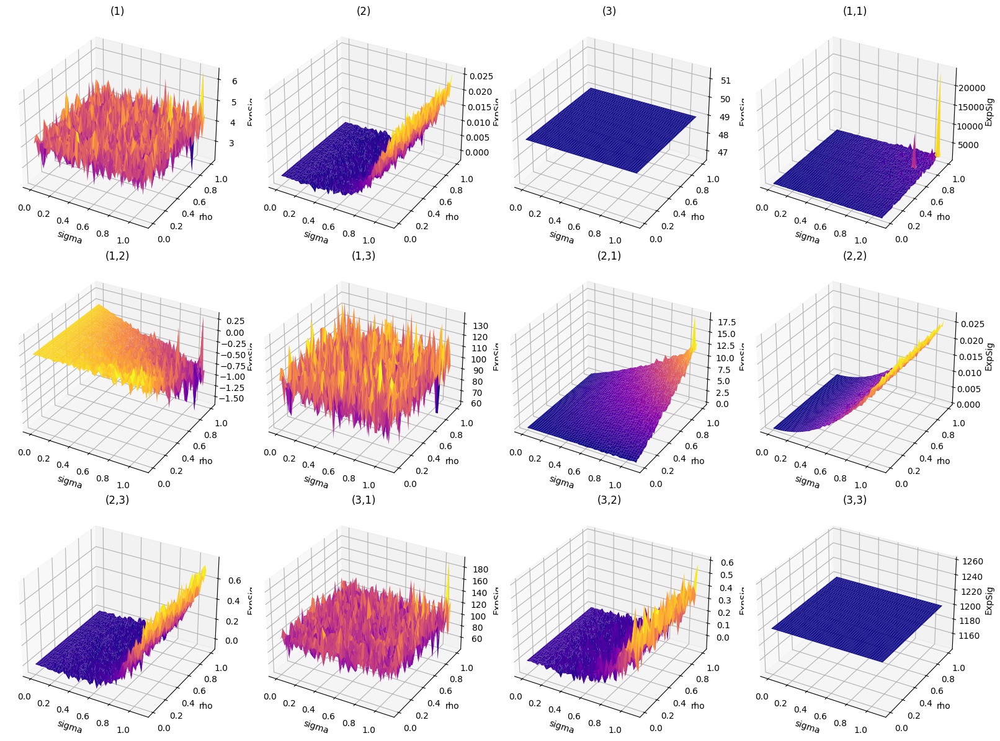

In [13]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    sigma_axs, rho_axs=np.meshgrid(by_parameter_2["by_sigmas"],by_parameter_2["by_rhos"])
    ax.plot_surface(sigma_axs,rho_axs,Exp_signatures_results_sigmas_and_rhos_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('sigma')
    axs[i].set_ylabel('rho')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Rhos and Sigmas

In [14]:
results_rhos_and_sigmas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='sigma')

In [15]:
signatures_results_rhos_and_sigmas_2_parameters=results_rhos_and_sigmas_2_parameters[0]
Exp_signatures_results_rhos_and_sigmas_2_parameters=results_rhos_and_sigmas_2_parameters[1]

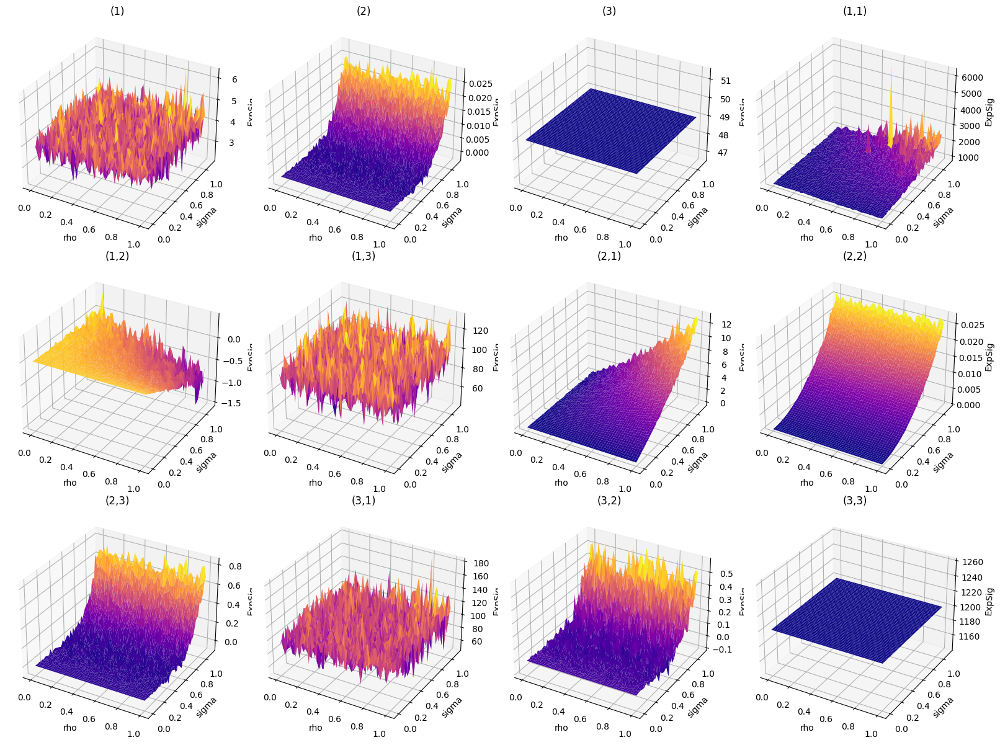

In [16]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    rho_axs, sigma_axs=np.meshgrid(by_parameter_2["by_rhos"],by_parameter_2["by_sigmas"])
    ax.plot_surface(rho_axs,sigma_axs,Exp_signatures_results_rhos_and_sigmas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('rho')
    axs[i].set_ylabel('sigma')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Kappas and Rhos

In [5]:
results_kappas_and_rhos_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='kappa',par2='rho')

In [7]:
signatures_results_kappas_and_rhos_2_parameters=results_kappas_and_rhos_2_parameters[0]
Exp_signatures_results_kappas_and_rhos_2_parameters=results_kappas_and_rhos_2_parameters[1]

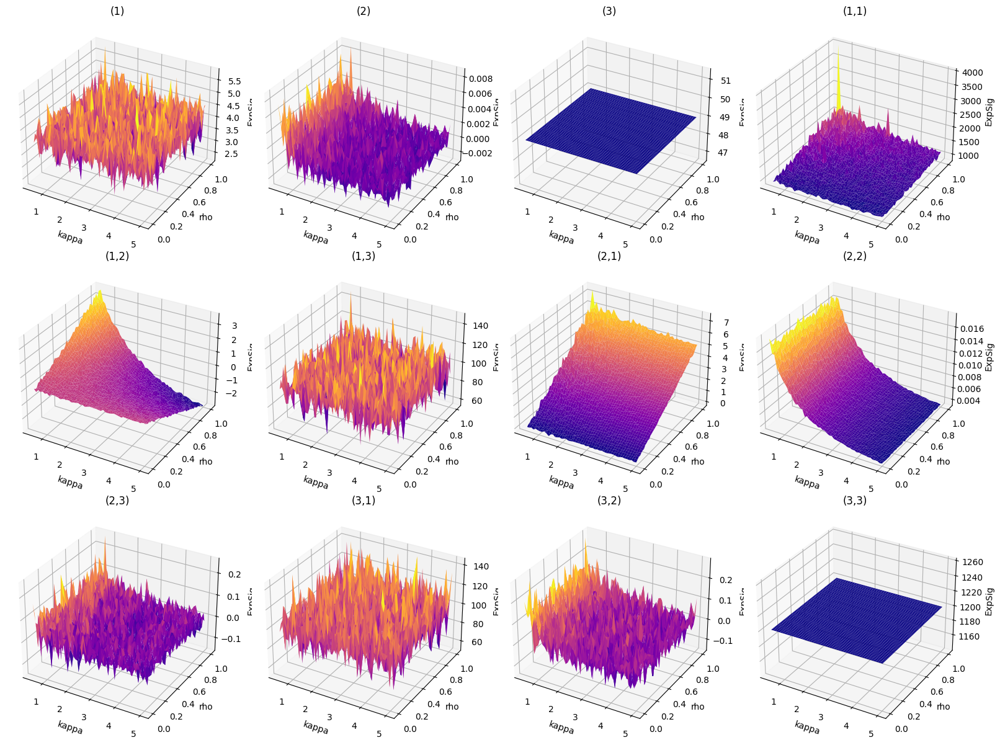

In [8]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    kappa_axs, rho_axs=np.meshgrid(by_parameter_2["by_kappas"],by_parameter_2["by_rhos"])
    ax.plot_surface(kappa_axs,rho_axs,Exp_signatures_results_kappas_and_rhos_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('kappa')
    axs[i].set_ylabel('rho')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()

Rhos and kappas

In [9]:
results_rhos_and_kappas_2_parameters=signatures_calculations_with_2parameters(S, T, rs, kappas, thetas, v_0s, rhos, sigmas, steps, paths, par1='rho',par2='kappa')

In [10]:
signatures_results_rhos_and_kappas_2_parameters=results_rhos_and_kappas_2_parameters[0]
Exp_signatures_results_rhos_and_kappas_2_parameters=results_rhos_and_kappas_2_parameters[1]

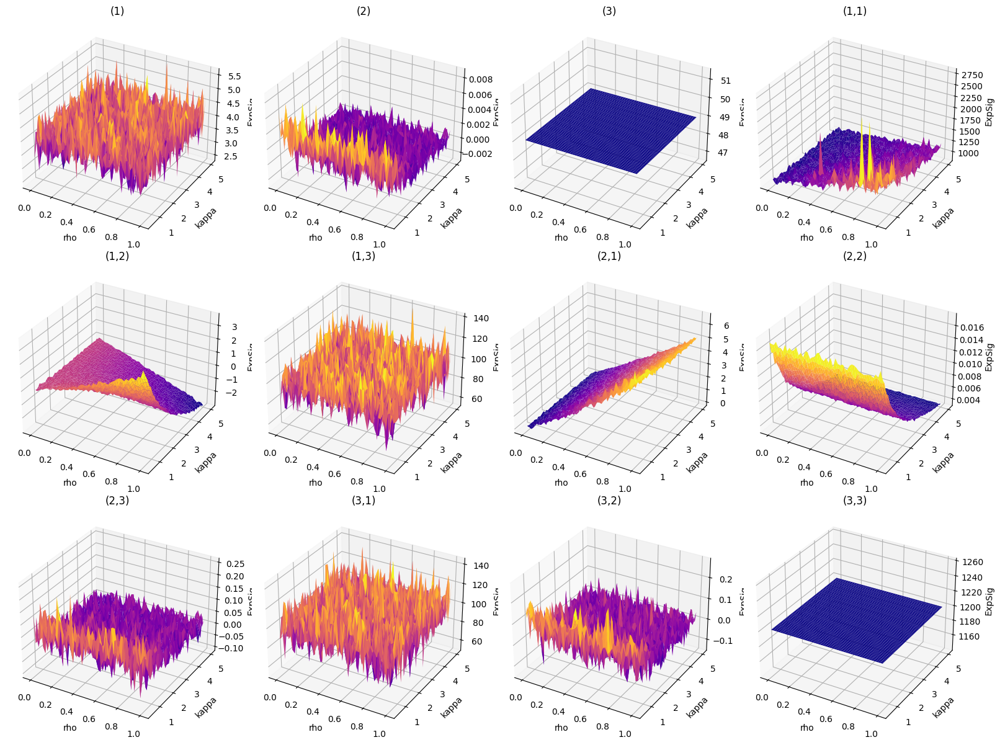

In [11]:
fig, axs = plt.subplots(3, 4, figsize=(4*4, 3*4), subplot_kw=dict(projection='3d'))
axs = axs.ravel()
for i, ax in enumerate(axs):
    rho_axs, kappa_axs=np.meshgrid(by_parameter_2["by_rhos"],by_parameter_2["by_kappas"])
    ax.plot_surface(rho_axs,kappa_axs,Exp_signatures_results_rhos_and_kappas_2_parameters.T[i],cmap='plasma', linewidths=0.15)
    axs[i].set_xlabel('rho')
    axs[i].set_ylabel('kappa')
    axs[i].set_zlabel('ExpSig')
    ax.title.set_text(sig_keys.split()[i+1])
plt.tight_layout()
plt.show()